# Python for Spatial Analysis
### Second part of the module of GG3209 Spatial Analysis with GIS
---
# Notebook to practice Spatial Clustering - Exercises
---
Dr Fernando Benitez -  University of St Andrews - School of Geography and Sustainable Development

# 1. Get the required data in your Drive

Go to [Kaggle - Car Accidents in the UK](https://www.kaggle.com/datasets/devansodariya/road-accident-united-kingdom-uk-dataset/) and download the **Road Accident (United Kingdom (UK)) dataset**. This dataset included **more than a millon of observations. So you definitly need to slide it to be able to work on Colab. This will be one of the challenges you will face.**

Upload the dataset in your **Google Drive**, Make sure you mount the Drive (if you don't recall how to do that, check the guideline about GeoPandas) in this Notebook so you can access the data in the following tasks.


---




# 2. Exploratory Data Analysis and K-means Clustering

Install additional libraries like Lonboard to display large datasets.

## Part A: Data Exploration and Pre-Processing

1. Use pandas to load the car accidents dataset.
2. Display the first few rows to understand the available attributes.
3. Keep only the necessary columns, have a mix of Numerical and Categorical attributes
4. Slice (cut) the pandas dataframe by including only records from 2010, which will reduce your dataset to approx 770585 rows.
5. Make a simple plot to represent which day of the week historically has had more car accidents. Which day?
6. Make a second plot to explore the relationship between **Accident Severity** and **Road Conditions**. What insights can you gain about that?. Use a Text Cell reflecting on the previous charts.
7. Using Lonboard Library map all the car accidents included in the filtered dataset.
8. Make a spatial filter (create a new dataset) to map only the car accidents In the Glasgow-Edinburgh Region, create another map using the lonboard library to display the car accidents only in that region.

## Part B: K-means Clustering Implementation:

1. Implement K-means clustering with different values of k. (e.g 3 and 5 clusters) To the filtered dataset you have created for the Glasgow-Edinburgh region.
2. Map the clusters using the lonboard library.
3. Describe in a Text Cell the clustering results. **How does the choice of k impact the clusters?**. Describe how the clusters change once you adjust multiple versions of that required parameter.
4. **Finally**: In the guideline, we worked using only the coordinates to create the clusters (`['Longitude', 'Latitude'`]), in another code cell, implement K-means clustering again, but now using the attributes included in the dataframe like `Accident_Severity, Number_of_Vehicles`.
5. Visualise the results using the `lonboard` library.
6. In a Text Cell, reflect on the clusters that include only the coordinates and the ones that also include other attributes. What insights can you gain about that?

---


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import pandas as pd
import geopandas as gpd
import numpy as np
!pip install lonboard
import lonboard as lb
from lonboard import Map, ScatterplotLayer, viz

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 55.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.9/2.9 MB 77.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.8/2.8 MB 45.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.0/8.0 MB 89.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.8/3.8 MB 87.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 72.2 MB/s eta 0:00:00


In [ ]:
import matplotlib.pyplot as plt

In [ ]:
import seaborn as sns

In [ ]:
import shapely
import folium

In [ ]:
from sklearn.cluster import KMeans, DBSCAN

In [ ]:
car_data = gpd.read_file('/content/drive/MyDrive/Colab/data/UK_Accident.csv') #1

In [ ]:
car_data.head() #2

,field_1,Accident_Index,Location_Easting_OSGR,Location_Northing_OSGR,Longitude,Latitude,Police_Force,Accident_Severity,Number_of_Vehicles,Number_of_Casualties,...,Pedestrian_Crossing-Physical_Facilities,Light_Conditions,Weather_Conditions,Road_Surface_Conditions,Special_Conditions_at_Site,Carriageway_Hazards,Urban_or_Rural_Area,Did_Police_Officer_Attend_Scene_of_Accident,LSOA_of_Accident_Location,Year
0,0,200501BS00001,525680.0,178240.0,-0.19117,51.489096,1,2,1,1,...,Zebra crossing,Daylight: Street light present,Raining without high winds,Wet/Damp,None,None,1,Yes,E01002849,2005
1,1,200501BS00002,524170.0,181650.0,-0.211708,51.520075,1,3,1,1,...,Pedestrian phase at traffic signal junction,Darkness: Street lights present and lit,Fine without high winds,Dry,None,None,1,Yes,E01002909,2005
2,2,200501BS00003,524520.0,182240.0,-0.206458,51.525301,1,3,2,1,...,No physical crossing within 50 meters,Darkness: Street lights present and lit,Fine without high winds,Dry,None,None,1,Yes,E01002857,2005
3,3,200501BS00004,526900.0,177530.0,-0.173862,51.482442,1,3,1,1,...,No physical crossing within 50 meters,Daylight: Street light present,Fine without high winds,Dry,None,None,1,Yes,E01002840,2005
4,4,200501BS00005,528060.0,179040.0,-0.156618,51.495752,1,3,1,1,...,No physical crossing within 50 meters,Darkness: Street lighting unknown,Fine without high winds,Wet/Damp,None,None,1,Yes,E01002863,2005


In [ ]:
car_data['Year'] = pd.to_numeric(car_data['Year'], errors='coerce')
recent_records = car_data[car_data['Year'] >= 2010]
print(recent_records)

        field_1 Accident_Index Location_Easting_OSGR Location_Northing_OSGR  \
733565   163554  201001BS70003              527580.0               177730.0   
733566   163555  201001BS70004              525340.0               180470.0   
733567   163556  201001BS70006              524800.0               180300.0   
733568   163557  201001BS70007              525080.0               180920.0   
733569   163558  201001BS70008              526760.0               177740.0   
...         ...            ...                   ...                    ...   
1504145  464692       2.01E+12              310037.0               597647.0   
1504146  464693       2.01E+12              321509.0               574063.0   
1504147  464694       2.01E+12              321337.0               566365.0   
1504148  464695       2.01E+12              323869.0               566853.0   
1504149  464696       2.01E+12              314072.0               579971.0   

         Longitude   Latitude Police_Force Accident

Text(0, 0.5, 'number of accidents')

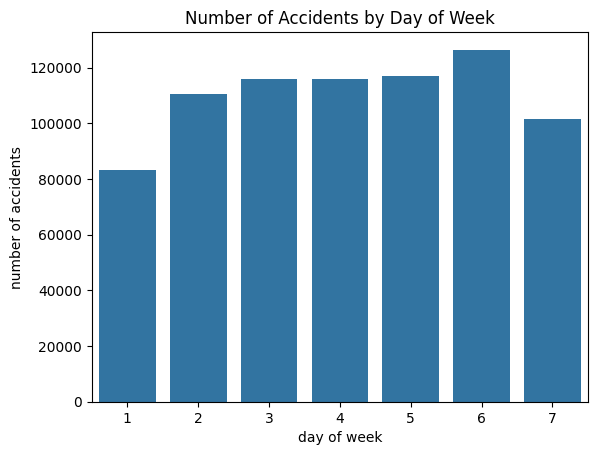

In [ ]:
sns.countplot(data=recent_records, x= 'Day_of_Week',order=['1','2','3','4','5','6','7'])
plt.title('number of accidents by day of week')
plt.xlabel('day of week')
plt.ylabel('number of accidents')

Text(0, 0.5, 'count of accidents')

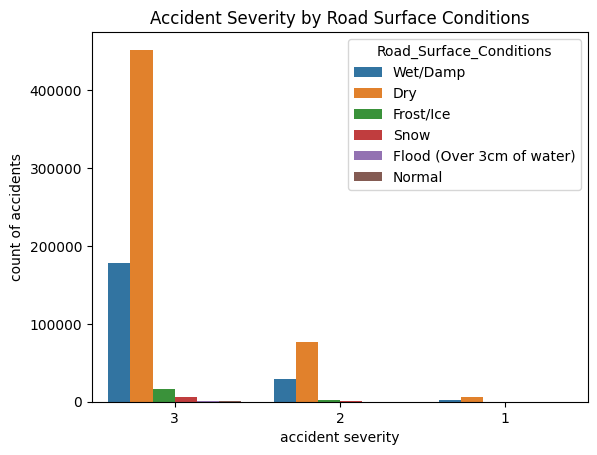

In [ ]:
sns.countplot(data=recent_records, x='Accident_Severity', hue='Road_Surface_Conditions')
plt.title('Accident Severity by Road Surface Conditions')
plt.xlabel('accident severity')
plt.ylabel('count of accidents')

In [ ]:
geometry = gpd.points_from_xy(recent_records.Longitude, recent_records.Latitude)
gdf_car_accidents = gpd.GeoDataFrame(recent_records, geometry=geometry, crs="EPSG:4326")
gdf_car_accidents.head()

,field_1,Accident_Index,Location_Easting_OSGR,Location_Northing_OSGR,Longitude,Latitude,Police_Force,Accident_Severity,Number_of_Vehicles,Number_of_Casualties,...,Light_Conditions,Weather_Conditions,Road_Surface_Conditions,Special_Conditions_at_Site,Carriageway_Hazards,Urban_or_Rural_Area,Did_Police_Officer_Attend_Scene_of_Accident,LSOA_of_Accident_Location,Year,geometry
733565,163554,201001BS70003,527580.0,177730.0,-0.164002,51.484087,1,3,2,1,...,Daylight: Street light present,Other,Wet/Damp,None,None,1,Yes,E01002900,2010,POINT (-0.164 51.48409)
733566,163555,201001BS70004,525340.0,180470.0,-0.195273,51.509212,1,3,1,1,...,Darkness: Street lights present and lit,Raining without high winds,Wet/Damp,None,None,1,Yes,E01002884,2010,POINT (-0.19527 51.50921)
733567,163556,201001BS70006,524800.0,180300.0,-0.20311,51.507804,1,3,2,1,...,Daylight: Street light present,Fine without high winds,Dry,None,None,1,Yes,E01002871,2010,POINT (-0.20311 51.5078)
733568,163557,201001BS70007,525080.0,180920.0,-0.198858,51.513314,1,3,2,1,...,Darkness: Street lights present and lit,Fine without high winds,Dry,None,None,1,Yes,E01002886,2010,POINT (-0.19886 51.51331)
733569,163558,201001BS70008,526760.0,177740.0,-0.175802,51.484361,1,3,2,1,...,Darkness: Street lights present and lit,Fine without high winds,Wet/Damp,None,None,1,Yes,E01002845,2010,POINT (-0.1758 51.48436)


In [ ]:
viz(gdf_car_accidents)

Map(basemap=MaplibreBasemap(mode='interleaved', style=<CartoStyle.DarkMatter: 'https://basemaps.cartocdn.com/g…

In [ ]:
gla_edi_bbox= [-4.532,55.77,-3.024,56.003]
data = gdf_car_accidents[gdf_car_accidents.intersects(shapely.box(*gla_edi_bbox))]

In [ ]:
viz(data)

Map(basemap=MaplibreBasemap(mode='interleaved', style=<CartoStyle.DarkMatter: 'https://basemaps.cartocdn.com/g…

In [ ]:
lat_long=data[['Latitude','Longitude']].values


In [ ]:
def k_means(lat_long, k, max_iterations=100):
    # Step 1: Initialize centroids
    centroids = initialize_centroids(lat_long, k) #See how I can call a function inside another one.

    for iteration in range(max_iterations):
        # Step 2: Assign data points to clusters
        clusters = assign_to_clusters(lat_long, centroids) # again in here.

        # Step 3: Update centroids
        new_centroids = update_centroids(lat_long, clusters, k)

        # Check for convergence (Again optional but just in case)
        if np.all(centroids == new_centroids):
            break

        centroids = new_centroids #Is this part of the loop?, what am I doing here, can you describe?


    return clusters, centroids


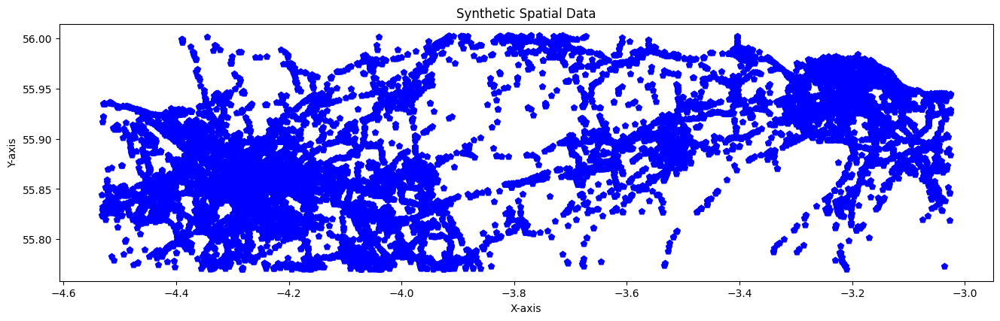

In [ ]:
geometry1 = gpd.points_from_xy(data['Longitude'], data['Latitude'])
gdf = gpd.GeoDataFrame(data, geometry=geometry1)

# Visualize the synthetic data
gdf.plot(marker='p', color='blue', figsize=(16, 16))
plt.title('Synthetic Spatial Data')
plt.xlabel('X-axis')
plt.ylabel('Y-axis')
plt.show()

In [ ]:
data['Latitude'] = pd.to_numeric(data['Latitude'], errors='coerce')
data['Longitude'] = pd.to_numeric(data['Longitude'], errors='coerce')

In [ ]:
k = 3
clusters, centroids = k_means(data, k)

# Visualize the results
plt.scatter(data[:, 10], data[:, 10], c=clusters, cmap='viridis', alpha=0.7)
plt.scatter(centroids[:, 10], centroids[:, 10], c='red', marker='X', label='Centroids')
plt.title('K-means Clustering - Manual implementation')
plt.xlabel('X Axis')
plt.ylabel('Y Axis')
plt.legend()
plt.show()


KeyError: "None of [Index([14886, 6842, 5262], dtype='int64')] are in the [columns]"

# 3. Spatial Analysis and DBSCAN Clustering

## Part A: Spatial Correlation

1. Create another GeoPandas Dataframe by rereading the data to avoid any confusion with the previous geodataframe. This new one is about DBSCAN name it accordingly.

2. Using the [BBox website](https://boundingbox.klokantech.com/), filter the
new geodataframe to contain only the accidents around **Birmingham**.

3. Using the Lonboard library, map the filtered dataset in **Birmingham**.

Before creating any spatial clustering, **it would be beneficial to explore any correlations to identify potential relationships between variables**, such as whether bad weather conditions influence accident severity or whether the number of vehicles involved correlates with the number of casualties.

4. In a code cell, investigate the data type of the attribute list, so you can identify which attributes are numerical and which are categorical. Tip: use `.dtypes`

5. In a code cell. Run the correlation between the numerical attributes by including in your code `corr= your_dataframe.corr()`

**You probably got an error running the previous code.**
**How can you solve this issue?**

Before asking ChatGPT or any GenAI tool, try **Pandas documentation** and see the parameters of the **corr** function, and find which is the parameter you need to only create a correlation matrix only for the numerical attributes. https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.corr.html


6. In a new Code Cell. Adjust the following code to create a heatmap plot of your correlation values.

In [ ]:
plt.figure(figsize=(10, 8))
sns.heatmap(
    your_corr_variable,
    annot=True,
    cmap='coolwarm',
    fmt='.2f',           # Format annotations to 2 decimal places
    linewidths=0.5,
    cbar_kws={'label': 'Correlation Coefficient'}
)

plt.title('Pearson -Correlation Matrix')
plt.show()

In terms of predictive modelling, having strong correlations indicate that one variable is an excellent predictor of the other. For example, if `Number_of_Casualties` has a 0.99 correlation (Pearson) with a separate column called `Injured_People_Count`, you know they convey almost identical information.

But **therer are downsides like potential Multicollinearity**, which means, if you are building a predictive model (like linear regression), having two variables that are too highly correlated (often > 0.9) can cause multicollinearity and require you to remove one of them.

Here is where our module associated with **Spatial Data Science** plays an important role. **Spatial statistical models** differ from standard (non-spatial) statistical models because they explicitly account for geographic location and the principle that nearby things are more related than distant things. The first law of geography.

In the same way you have evaluated and learn from the GWR method, in this exercise, we can apply Moran's I.

In this context of our car accident dataset, while a standard stadistic(Pearson) might tell you that severe weather correlates globally with severe accidents, a spatial model could tell us that this relationship only holds true in coastal areas, while in mountain areas, road surface conditions are more important locally.

---

7. Install the library **pysal** by running in a code cell:
`pip install pysal `

8. Now import the new and requieres libraries.

```
import libpysal.weights as weights
from esda.moran import Moran
```
9. You must reproject your dataset (recall the EPSG code you used in the guideline notebook to study spatial data in the UK)



After you reproject the dataset, you can now use it to run Local Moran's I and Spatial clustering DBSCAN. **Adjust the following code to match your variable and datasets**

In [ ]:
w = weights.DistanceBand.from_dataframe(your_dataset_projected, threshold=500, ids=your_dataset.index) #Adjust this line to match your variables.
w.transform = 'R'
moran = Moran(your_dataset['Accident_Severity'], w) #Adjust this line to match your variables.

print(f"\n--- Moran's I Spatial Autocorrelation Analysis ---")
print(f"Defined {w.n} observations and {w.mean_neighbors:.2f} average neighbors per point.")
print(f"\nMoran's I Statistic (Observed I): {moran.I:.4f}")
print(f"P-value (significance): {moran.p_sim:.4f}")

**How to read the results:**

The resulting moran.I value tells you about the spatial pattern defined in the requested dataset.

- **Near +1**: High positive spatial autocorrelation
- **Near -1**: Negative spatial autocorrelation
- **Near 0**: A random spatial pattern

10. In a Text Cell, describe with your own words the results., What insights can you gain from the correlation analysis.

In [ ]:
birm_car_data = gpd.read_file('/content/drive/MyDrive/Colab/data/UK_Accident.csv') #1

In [ ]:
birm_car_data['Year'] = pd.to_numeric(birm_car_data['Year'], errors='coerce')
birm_recent_records = birm_car_data[birm_car_data['Year'] >= 2010]
print(birm_recent_records)

        field_1 Accident_Index Location_Easting_OSGR Location_Northing_OSGR  \
733565   163554  201001BS70003              527580.0               177730.0   
733566   163555  201001BS70004              525340.0               180470.0   
733567   163556  201001BS70006              524800.0               180300.0   
733568   163557  201001BS70007              525080.0               180920.0   
733569   163558  201001BS70008              526760.0               177740.0   
...         ...            ...                   ...                    ...   
1504145  464692       2.01E+12              310037.0               597647.0   
1504146  464693       2.01E+12              321509.0               574063.0   
1504147  464694       2.01E+12              321337.0               566365.0   
1504148  464695       2.01E+12              323869.0               566853.0   
1504149  464696       2.01E+12              314072.0               579971.0   

         Longitude   Latitude Police_Force Accident

In [ ]:
geometry = gpd.points_from_xy(birm_recent_records.Longitude, birm_recent_records.Latitude)
birm_car_accidents = gpd.GeoDataFrame(birm_recent_records, geometry=geometry, crs="EPSG:4326")
birm_car_accidents.head()

,field_1,Accident_Index,Location_Easting_OSGR,Location_Northing_OSGR,Longitude,Latitude,Police_Force,Accident_Severity,Number_of_Vehicles,Number_of_Casualties,...,Light_Conditions,Weather_Conditions,Road_Surface_Conditions,Special_Conditions_at_Site,Carriageway_Hazards,Urban_or_Rural_Area,Did_Police_Officer_Attend_Scene_of_Accident,LSOA_of_Accident_Location,Year,geometry
733565,163554,201001BS70003,527580.0,177730.0,-0.164002,51.484087,1,3,2,1,...,Daylight: Street light present,Other,Wet/Damp,None,None,1,Yes,E01002900,2010,POINT (-0.164 51.48409)
733566,163555,201001BS70004,525340.0,180470.0,-0.195273,51.509212,1,3,1,1,...,Darkness: Street lights present and lit,Raining without high winds,Wet/Damp,None,None,1,Yes,E01002884,2010,POINT (-0.19527 51.50921)
733567,163556,201001BS70006,524800.0,180300.0,-0.20311,51.507804,1,3,2,1,...,Daylight: Street light present,Fine without high winds,Dry,None,None,1,Yes,E01002871,2010,POINT (-0.20311 51.5078)
733568,163557,201001BS70007,525080.0,180920.0,-0.198858,51.513314,1,3,2,1,...,Darkness: Street lights present and lit,Fine without high winds,Dry,None,None,1,Yes,E01002886,2010,POINT (-0.19886 51.51331)
733569,163558,201001BS70008,526760.0,177740.0,-0.175802,51.484361,1,3,2,1,...,Darkness: Street lights present and lit,Fine without high winds,Wet/Damp,None,None,1,Yes,E01002845,2010,POINT (-0.1758 51.48436)


In [ ]:
birm_bbox= [-2.201,52.334,-1.6,52.666]
birm_data = birm_car_accidents[birm_car_accidents.intersects(shapely.box(*birm_bbox))]

In [ ]:
lb.viz(birm_data)

Map(basemap=MaplibreBasemap(mode='interleaved', style=<CartoStyle.DarkMatter: 'https://basemaps.cartocdn.com/g…

In [ ]:
birm_car_data.dtypes

,0
field_1,object
Accident_Index,object
Location_Easting_OSGR,object
Location_Northing_OSGR,object
Longitude,object
Latitude,object
Police_Force,object
Accident_Severity,object
Number_of_Vehicles,object
Number_of_Casualties,object


In [ ]:
corr= birm_car_data.corr(numeric_only=True)

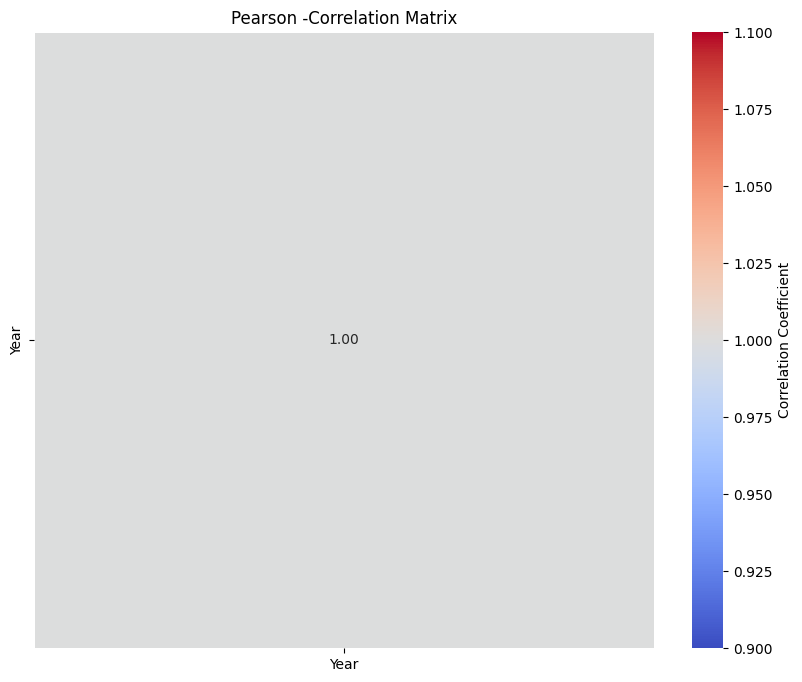

In [ ]:
plt.figure(figsize=(10, 8))
sns.heatmap(
    corr,
    annot=True,
    cmap='coolwarm',
    fmt='.2f',           # Format annotations to 2 decimal places
    linewidths=0.5,
    cbar_kws={'label': 'Correlation Coefficient'}
)

plt.title('Pearson -Correlation Matrix')
plt.show()

In [ ]:
pip install pysal

  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.6/56.6 kB 5.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 157.1/157.1 kB 13.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.3/61.3 kB 6.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 882.2/882.2 kB 56.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 47.9/47.9 kB 4.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 83.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 63.5/63.5 kB 4.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 141.6/141.6 kB 14.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.9/53.9 kB 5.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.4/41.4 kB 4.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 248.1/248.1 kB 24.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 389.9/389.9 kB 34.0 MB/s eta 0:00:00
   ━━━━

In [ ]:
import libpysal.weights as weights
from esda.moran import Moran

In [ ]:
birm_data_p = birm_data.to_crs(epsg=27700)
birm_data_p.head()

,field_1,Accident_Index,Location_Easting_OSGR,Location_Northing_OSGR,Longitude,Latitude,Police_Force,Accident_Severity,Number_of_Vehicles,Number_of_Casualties,...,Light_Conditions,Weather_Conditions,Road_Surface_Conditions,Special_Conditions_at_Site,Carriageway_Hazards,Urban_or_Rural_Area,Did_Police_Officer_Attend_Scene_of_Accident,LSOA_of_Accident_Location,Year,geometry
794859,224848,201020D002713,416320.0,287250.0,-1.761121,52.482901,20,3,2,2,...,Daylight: Street light present,Fine without high winds,Dry,None,None,1,No,E01009297,2010,POINT (416319.622 287246.657)
794860,224849,201020D004613,410000.0,286170.0,-1.854218,52.473343,20,3,2,1,...,Darkness: Street lights present and lit,Fine without high winds,Wet/Damp,None,None,1,Yes,E01009344,2010,POINT (409999.425 286166.661)
794861,224850,201020D006113,410700.0,286400.0,-1.843905,52.475397,20,3,1,1,...,Darkness: Street lights present and lit,Fine without high winds,Wet/Damp,None,None,1,Yes,E01009343,2010,POINT (410699.453 286396.599)
794862,224851,201020D006513,411720.0,285830.0,-1.828907,52.470252,20,3,2,1,...,Daylight: Street light present,Other,Frost/Ice,None,None,1,No,E01009326,2010,POINT (411719.514 285826.598)
794863,224852,201020D006913,412650.0,286650.0,-1.815186,52.477604,20,3,2,2,...,Darkness: Street lights present and lit,Unknown,Frost/Ice,None,None,1,Yes,E01009513,2010,POINT (412649.503 286646.69)


In [ ]:
birm_data['Accident_Severity'] = pd.to_numeric(birm_data['Accident_Severity'], errors='coerce')
birm_data.dropna(subset=['Accident_Severity'], inplace=True)

w = weights.DistanceBand.from_dataframe(birm_data_p, threshold=500, ids=birm_data.index)
w.transform = 'R'
moran = Moran(birm_data['Accident_Severity'], w)

print(f"\n--- Moran's I Spatial Autocorrelation Analysis ---")
print(f"Defined {w.n} observations and {w.mean_neighbors:.2f} average neighbors per point.")
print(f"\nMoran's I Statistic (Observed I): {moran.I:.4f}")
print(f"P-value (significance): {moran.p_sim:.4f}")

/usr/local/lib/python3.12/dist-packages/geopandas/geodataframe.py:1968: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/tmp/ipython-input-2399169328.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  birm_data.dropna(subset=['Accident_Severity'], inplace=True)
/usr/local/lib/python3.12/dist-packages/libpysal/weights/util.py:826: UserWarning: The weights matrix is not fully connected: 
 There are 300 disconnected components.
 There are 114 islands with ids: 796288, 797824, 797832, 797875, 797931, 797936, 797977, 797980, 798786, 8012

('WARNING: ', 796288, ' is an island (no neighbors)')
('WARNING: ', 797824, ' is an island (no neighbors)')
('WARNING: ', 797832, ' is an island (no neighbors)')
('WARNING: ', 797875, ' is an island (no neighbors)')
('WARNING: ', 797931, ' is an island (no neighbors)')
('WARNING: ', 797936, ' is an island (no neighbors)')
('WARNING: ', 797977, ' is an island (no neighbors)')
('WARNING: ', 797980, ' is an island (no neighbors)')
('WARNING: ', 798786, ' is an island (no neighbors)')
('WARNING: ', 801281, ' is an island (no neighbors)')
('WARNING: ', 801650, ' is an island (no neighbors)')
('WARNING: ', 801669, ' is an island (no neighbors)')
('WARNING: ', 802578, ' is an island (no neighbors)')
('WARNING: ', 802925, ' is an island (no neighbors)')
('WARNING: ', 802950, ' is an island (no neighbors)')
('WARNING: ', 803113, ' is an island (no neighbors)')
('WARNING: ', 803421, ' is an island (no neighbors)')
('WARNING: ', 804227, ' is an island (no neighbors)')
('WARNING: ', 805203, ' is a

interpret results

## Part B: DBSCAN Clustering Implementation:

1. Implement DBSCAN clustering with different **eps** and **min_samples** to the projected dataset.
2. Map the clusters using the Plotly Library.
3. Describe in a Text Cell the clustering results. **How does the choice of eps and min_samples impact the clusters?**. Describe how the clusters change once you adjust multiple versions of that required parameter.
4. In a Text Cell, briefly reflect on the clusters created using **K-Means** and the ones generated with **DBSCAN**. What insights can you gain from that?, Do you see any limitations?
5. Finally, in a new text cell address the following question: **What do you think are the real-world implications of the identified clusters in the field of urban planning?**

---

If you finished the initial guide and all the challenges included in this notebeook. **Upload the finished version of both notebooks to your GitHub repository** (check how to do it in the workbook lab document included in Moodle), and **Congrats you have finished**

### **Important Note:** Avoid using ChatGPT for your reflective notes. Instead, describe in your own words what you observe from your analysis results. I want to see and read your authentic thoughts and insights based on your understanding, rather than a complicated or overly structured response. Take some time to evaluate the results you have obtained and make an effort to briefly describe what you have found.


In [ ]:
birm_data_p['geometry_x'] = birm_data_p.geometry.x
birm_data_p['geometry_y'] = birm_data_p.geometry.y
birm_data_p.head()

,field_1,Accident_Index,Location_Easting_OSGR,Location_Northing_OSGR,Longitude,Latitude,Police_Force,Accident_Severity,Number_of_Vehicles,Number_of_Casualties,...,Road_Surface_Conditions,Special_Conditions_at_Site,Carriageway_Hazards,Urban_or_Rural_Area,Did_Police_Officer_Attend_Scene_of_Accident,LSOA_of_Accident_Location,Year,geometry,geometry_x,geometry_y
794859,224848,201020D002713,416320.0,287250.0,-1.761121,52.482901,20,3,2,2,...,Dry,None,None,1,No,E01009297,2010,POINT (416319.622 287246.657),416319.621756,287246.656628
794860,224849,201020D004613,410000.0,286170.0,-1.854218,52.473343,20,3,2,1,...,Wet/Damp,None,None,1,Yes,E01009344,2010,POINT (409999.425 286166.661),409999.424584,286166.661341
794861,224850,201020D006113,410700.0,286400.0,-1.843905,52.475397,20,3,1,1,...,Wet/Damp,None,None,1,Yes,E01009343,2010,POINT (410699.453 286396.599),410699.453242,286396.599056
794862,224851,201020D006513,411720.0,285830.0,-1.828907,52.470252,20,3,2,1,...,Frost/Ice,None,None,1,No,E01009326,2010,POINT (411719.514 285826.598),411719.513963,285826.598275
794863,224852,201020D006913,412650.0,286650.0,-1.815186,52.477604,20,3,2,2,...,Frost/Ice,None,None,1,Yes,E01009513,2010,POINT (412649.503 286646.69),412649.503371,286646.690097


In [ ]:
meters_eps = 40
min_samples_val = 200

dbscan = DBSCAN(eps=meters_eps, min_samples=min_samples_val)

birm_data_p['dbscan_cluster'] = dbscan.fit_predict(
    birm_data_p[['geometry_x', 'geometry_y']])

birm_data_p.head()


,field_1,Accident_Index,Location_Easting_OSGR,Location_Northing_OSGR,Longitude,Latitude,Police_Force,Accident_Severity,Number_of_Vehicles,Number_of_Casualties,...,Special_Conditions_at_Site,Carriageway_Hazards,Urban_or_Rural_Area,Did_Police_Officer_Attend_Scene_of_Accident,LSOA_of_Accident_Location,Year,geometry,geometry_x,geometry_y,dbscan_cluster
794859,224848,201020D002713,416320.0,287250.0,-1.761121,52.482901,20,3,2,2,...,None,None,1,No,E01009297,2010,POINT (416319.622 287246.657),416319.621756,287246.656628,-1
794860,224849,201020D004613,410000.0,286170.0,-1.854218,52.473343,20,3,2,1,...,None,None,1,Yes,E01009344,2010,POINT (409999.425 286166.661),409999.424584,286166.661341,-1
794861,224850,201020D006113,410700.0,286400.0,-1.843905,52.475397,20,3,1,1,...,None,None,1,Yes,E01009343,2010,POINT (410699.453 286396.599),410699.453242,286396.599056,-1
794862,224851,201020D006513,411720.0,285830.0,-1.828907,52.470252,20,3,2,1,...,None,None,1,No,E01009326,2010,POINT (411719.514 285826.598),411719.513963,285826.598275,-1
794863,224852,201020D006913,412650.0,286650.0,-1.815186,52.477604,20,3,2,2,...,None,None,1,Yes,E01009513,2010,POINT (412649.503 286646.69),412649.503371,286646.690097,-1


In [ ]:
import plotly.express as px

# Ensure 'Latitude' and 'Longitude' are numeric in birm_data_p
birm_data_p['Latitude'] = pd.to_numeric(birm_data_p['Latitude'], errors='coerce')
birm_data_p['Longitude'] = pd.to_numeric(birm_data_p['Longitude'], errors='coerce')

# Drop any rows that might have become NaN during conversion
birm_data_p.dropna(subset=['Latitude', 'Longitude'], inplace=True)

fig_dbscan = px.scatter_mapbox(
    birm_data_p,
    lat="Latitude",
    lon="Longitude",
    color="dbscan_cluster",
    mapbox_style="carto-positron",
    zoom=9.5,  # Adjust zoom level as needed
    title="DBSCAN Clustering",
    height=700,    # Set initial height in pixels (width is responsive)
    opacity=0.5,

)
fig_dbscan.show()